In [25]:
from shapely.geometry import Point
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from haversine import haversine
from datetime import datetime
import seaborn as sns
import matplotlib
from matplotlib.pyplot import figure
#import geopandas as gpd
#from geopandas import GeoDataFrame
from matplotlib.dates import DateFormatter

In [3]:
df = pd.read_csv(r'../../data/tidy/large/vehicle-locations.csv', delimiter=',', skiprows=0, low_memory=False)

In [4]:
df.head()

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Onboard,Bike,Wheelchair,Weekday,Hour,Minute,Second,Date,Daytype,time
0,2022-04-04 06:43:24,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,0,0,0,2,6,43,24,2022-04-04,Weekday,06:43:24
1,2022-04-04 06:51:27,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,1,0,0,2,6,51,27,2022-04-04,Weekday,06:51:27
2,2022-04-04 06:51:27,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,1,0,0,2,6,51,27,2022-04-04,Weekday,06:51:27
3,2022-04-04 06:52:52,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,1,0,0,2,6,52,52,2022-04-04,Weekday,06:52:52
4,2022-04-04 06:54:33,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,1,0,0,2,6,54,33,2022-04-04,Weekday,06:54:33


In [5]:
df.tail()

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Onboard,Bike,Wheelchair,Weekday,Hour,Minute,Second,Date,Daytype,time
1361544,2022-04-30 23:54:20,1325566,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,5,0,0,7,23,54,20,2022-04-30,Weekend,23:54:20
1361545,2022-04-30 23:55:24,1325567,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,5,0,0,7,23,55,24,2022-04-30,Weekend,23:55:24
1361546,2022-04-30 23:56:47,1325568,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,4,0,0,7,23,56,47,2022-04-30,Weekend,23:56:47
1361547,2022-04-30 23:57:32,1325569,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,4,0,0,7,23,57,32,2022-04-30,Weekend,23:57:32
1361548,2022-04-30 23:59:29,1325570,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,3,0,0,7,23,59,29,2022-04-30,Weekend,23:59:29


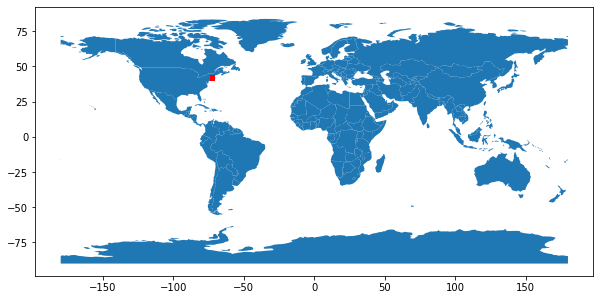

In [69]:
geometry = [Point(xy) for xy in zip(df['Lon'], df['Lat'])]
gdf = GeoDataFrame(df, geometry=geometry)   

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15);

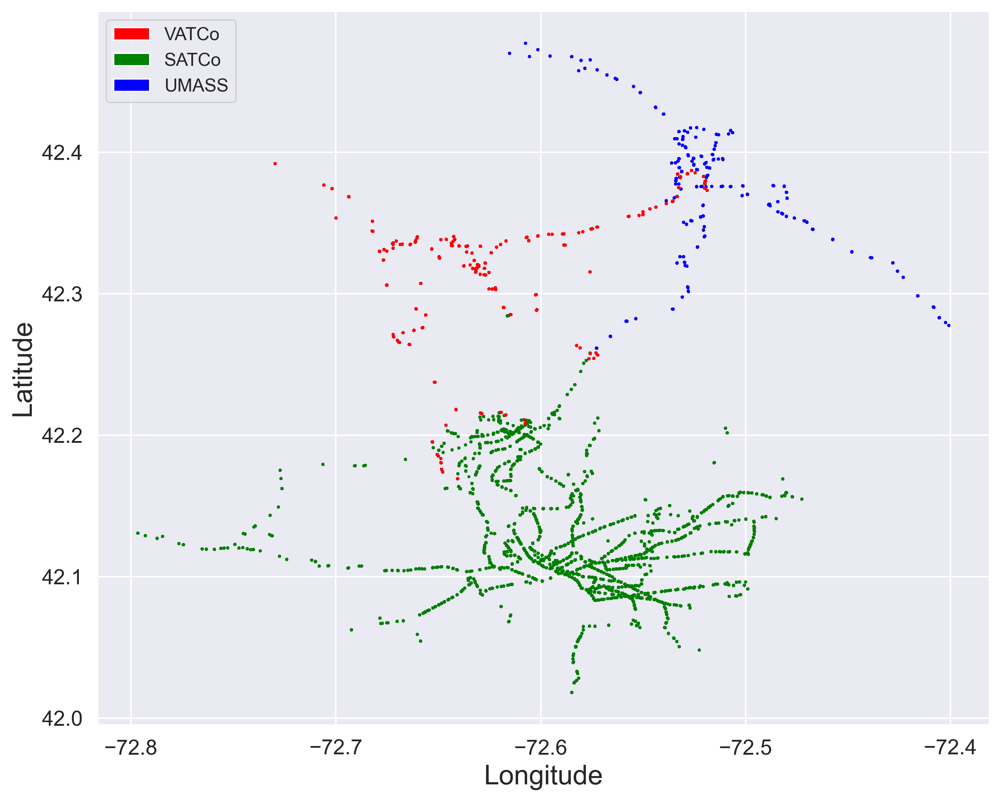

In [125]:
plt.figure(figsize=(10, 8), dpi=300)
colors = {'VATCo':'red', 'SATCo':'green', 'UMASS':'blue'}
plt.scatter(x=df['Lon'], y=df['Lat'], c= df['Operator'].map(colors), s=1)
plt.xlabel("Longitude", fontsize=18)
plt.ylabel("Latitude", fontsize=18)

circ1 = mpatches.Patch(facecolor='red',label='VATCo')
circ2= mpatches.Patch(facecolor='green',label='SATCo')
circ3 = mpatches.Patch(facecolor='blue',label='UMASS')

plt.legend(handles = [circ1,circ2,circ3],loc=2,fontsize=12)
plt.tight_layout()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)

plt.savefig(r'../../figures/operators-stops.png', dpi=400, bbox_inches='tight')
plt.show()

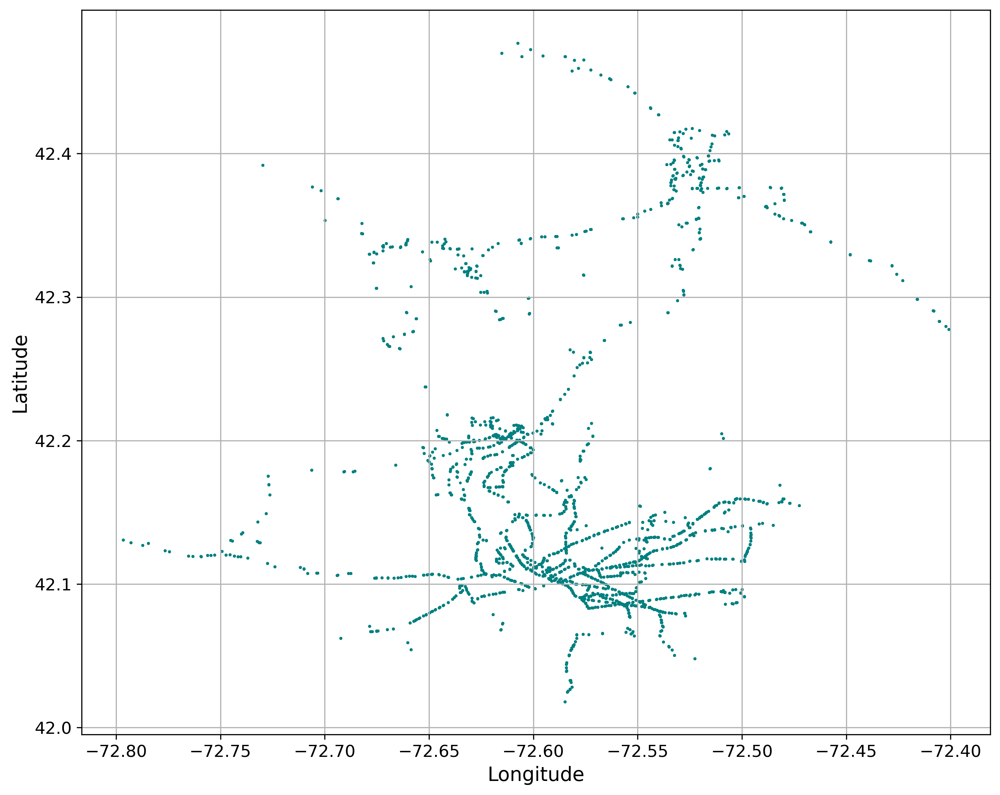

In [339]:
# ver02
plt.figure(figsize=(10, 8), dpi=300)
plt.scatter(x=df['Lon'], y=df['Lat'], s=1, color="teal")
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)

circ1 = mpatches.Patch(facecolor='red',label='VATCo')
circ2= mpatches.Patch(facecolor='green',label='SATCo')
circ3 = mpatches.Patch(facecolor='blue',label='UMASS')

#plt.legend(handles = [circ1,circ2,circ3],loc=2,fontsize=12)
plt.tight_layout()
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.grid()

plt.savefig(r'../../figures/operators-stops.png', dpi=400, bbox_inches='tight')
plt.show()

In [345]:
df.columns

Index(['ServiceDateTime', 'Unnamed: 0', 'DateKey', 'CalendarDate', 'Year',
       'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2', 'Route', 'RouteName',
       'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName', 'Lat', 'Lon',
       'Vehicle', 'VehicleType', 'SeatedCap', 'TotalCap', 'Boards', 'Alights',
       'Onboard', 'Bike', 'Wheelchair', 'Weekday', 'Hour', 'Minute', 'Second',
       'Date', 'Daytype', 'time'],
      dtype='object')

In [6]:
len(df.Vehicle.unique())

178

In [7]:
df.Vehicle.unique()

array([1205, 1320, 1321, 1322, 1323, 1410, 1411, 1412, 1413, 1415, 1416,
       1420, 1421, 1552, 1553, 1555, 1557, 1563, 1564, 1565, 1566, 1567,
       1568, 1571, 1572, 1574, 1575, 1576, 1577, 1578, 1619, 1640, 1642,
       1643, 1644, 1648, 1649, 1650, 1651, 1652, 1653, 1654, 1655, 1656,
       1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1670, 1671, 1672,
       1701, 1710, 1711, 1712, 1714, 1715, 1716, 1717, 1718, 1719, 1720,
       1721, 1722, 1723, 1724, 1725, 1726, 1727, 1728, 1729, 1801, 1802,
       1803, 1804, 1805, 1811, 1812, 1813, 1814, 1815, 1817, 1819, 1821,
       1822, 1823, 1824, 1825, 1826, 1831, 1832, 1833, 1834, 1835, 1836,
       1837, 1840, 1841, 1842, 1843, 1844, 1845, 1847, 1848, 1849, 1850,
       1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861,
       1862, 1864, 3212, 3221, 3222, 3223, 3225, 3226, 3228, 3301, 3302,
       3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313,
       3314, 3316, 3317, 3318, 3319, 3320, 3321, 33

In [8]:
vehicles=df.Vehicle.unique()

In [9]:
df

,ServiceDateTime,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Onboard,Bike,Wheelchair,Weekday,Hour,Minute,Second,Date,Daytype,time
0,2022-04-04 06:43:24,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,0,0,0,2,6,43,24,2022-04-04,Weekday,06:43:24
1,2022-04-04 06:51:27,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,1,0,0,2,6,51,27,2022-04-04,Weekday,06:51:27
2,2022-04-04 06:51:27,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,1,0,0,2,6,51,27,2022-04-04,Weekday,06:51:27
3,2022-04-04 06:52:52,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,1,0,0,2,6,52,52,2022-04-04,Weekday,06:52:52
4,2022-04-04 06:54:33,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,1,0,0,2,6,54,33,2022-04-04,Weekday,06:54:33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1361544,2022-04-30 23:54:20,1325566,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,5,0,0,7,23,54,20,2022-04-30,Weekend,23:54:20
1361545,2022-04-30 23:55:24,1325567,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,5,0,0,7,23,55,24,2022-04-30,Weekend,23:55:24
1361546,2022-04-30 23:56:47,1325568,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,4,0,0,7,23,56,47,2022-04-30,Weekend,23:56:47
1361547,2022-04-30 23:57:32,1325569,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,4,0,0,7,23,57,32,2022-04-30,Weekend,23:57:32


In [6]:
df.index

RangeIndex(start=0, stop=1361549, step=1)

In [7]:
df['ServiceDateTime']= pd.to_datetime(df['ServiceDateTime'])

In [8]:
df['time_delta'] = df.groupby(['Vehicle', 'Date'])['ServiceDateTime'].diff()

In [9]:
df.time_delta=df.time_delta.astype(str).str.replace('0 days ', '')

In [10]:
df['time_delta']= pd.to_datetime(df['time_delta'])

In [11]:
df['time_delta_in_seconds'] = df['time_delta'].dt.hour * 3600 + df['time_delta'].dt.minute * 60 + df['time_delta'].dt.second

In [12]:
df.sort_values(by=['Vehicle','ServiceDateTime'], ascending=True, inplace=True)

In [13]:
#calculating distances by unique vehicle Id and unique day
dist=[]
for i in df.index:
    if i==0:
        dist.append(0) 
    else:
        if df['Vehicle'].loc[i]==df['Vehicle'].loc[i-1]:
            if df['Date'].loc[i]==df['Date'].loc[i-1]:           
                coordinate_x = (df['Lon'].loc[i] ,df['Lat'].loc[i]) # (lat, lon) for x
                coordinate_x_minus_1 = (df['Lon'].loc[i-1] ,df['Lat'].loc[i-1]) #(lat, lon) for x-1
                distance=haversine(coordinate_x_minus_1, coordinate_x, unit='mi')
                dist.append(distance) 
            else:
                dist.append(0) 
        else:   
            dist.append(0) 
df['dist'] = dist
#df.to_csv(r'../../results/computed-distances.csv')

In [14]:
#calculating speed by unique vehicle Id and unique day
speed=[]
for i in df.index:
    if i==0 or i==1:
        speed.append(0) 
    else:
        if df['Vehicle'].loc[i]==df['Vehicle'].loc[i-1]:
            if df['Date'].loc[i]==df['Date'].loc[i-1]:
                FMT = '%H:%M:%S'
                time_diff = abs(datetime.strptime(df['time'].loc[i-1], FMT) - datetime.strptime(df['time'].loc[i], FMT)).total_seconds() / 3600.0
                distance = df['dist'].loc[i]
                if time_diff==0:
                    speed.append(0) 
                else:
                    speed_current=distance/time_diff
                    if speed_current>=90:
                        speed.append(0) 
                    else:    
                        speed.append(speed_current) 
            else:
                speed.append(0) 
        else:   
            speed.append(0) 
df['speed'] = speed
#df.to_csv(r'../../results/computed-speeds.csv')

In [15]:
#calculating acceleration by unique vehicle Id and unique day
acc=[]
for i in df.index:
    if i==0 or i==1 or i==2:
        acc.append(0) 
    else:
        if df['Vehicle'].loc[i]==df['Vehicle'].loc[i-1]:
            if df['Date'].loc[i]==df['Date'].loc[i-1]:
                FMT = '%H:%M:%S'
                time_diff = abs(datetime.strptime(df['time'].loc[i-1], FMT) - datetime.strptime(df['time'].loc[i], FMT)).total_seconds() / 3600.0
                speed_diff = df['speed'].loc[i] - df['speed'].loc[i-1]
                if time_diff==0:
                    acc.append(0) 
                else:
                    acc_current=(speed_diff/time_diff)*0.00012417777777778 # 1 miles/h2 = 0.00012417777777778 m/s2
                    if -5<acc_current<5:
                        acc.append(acc_current)
                    else:
                        acc.append(0)
            else:
                acc.append(0) 
        else:   
            acc.append(0) 
df['acc'] = acc
df.to_csv(r'../../results/computed-trajectories.csv')

In [16]:
# Filtering all rows related to interval less than 2 seconds
df=df.drop(df[(df['time_delta_in_seconds'] !=0) & (df['time_delta_in_seconds']< 2)].index)
#df = df.loc[~((df['time_delta_in_seconds'] != 0) & (df['time_delta_in_seconds'] < 2)),:]

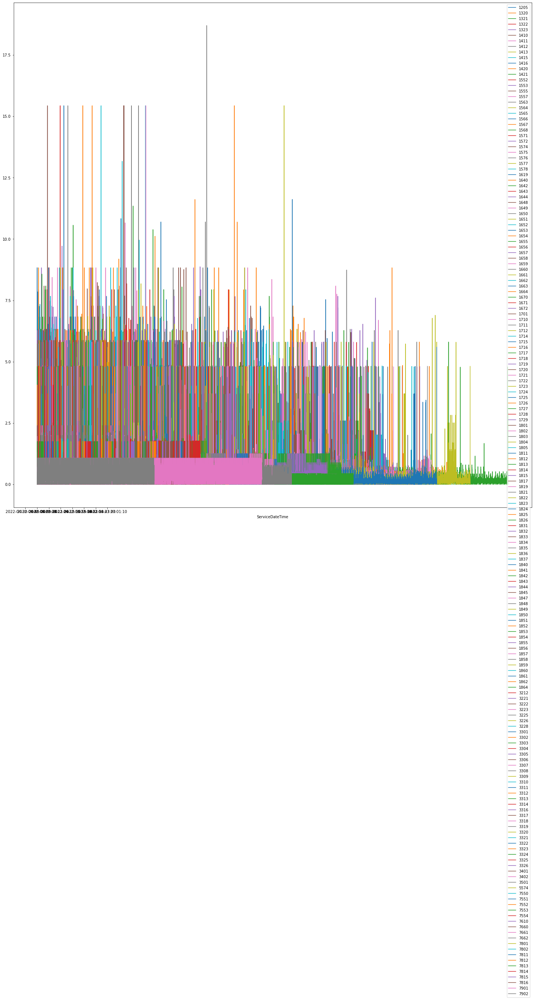

In [82]:
fig, ax = plt.subplots(figsize=(25,25))
for vehicle, gp in df.groupby('Vehicle'):
    gp.plot(x='ServiceDateTime', y='dist', ax=ax, label=vehicle)

In [83]:
#import seaborn as sns
#sns.lineplot(data=df, hue='Vehicle', x='ServiceDateTime', y='dist')

In [84]:
#import seaborn as sns
#sns.lineplot(data=df, hue='Vehicle', x='ServiceDateTime', y='speed')

In [85]:
#import seaborn as sns
#sns.lineplot(data=df, hue='Vehicle', x='ServiceDateTime', y='acc')

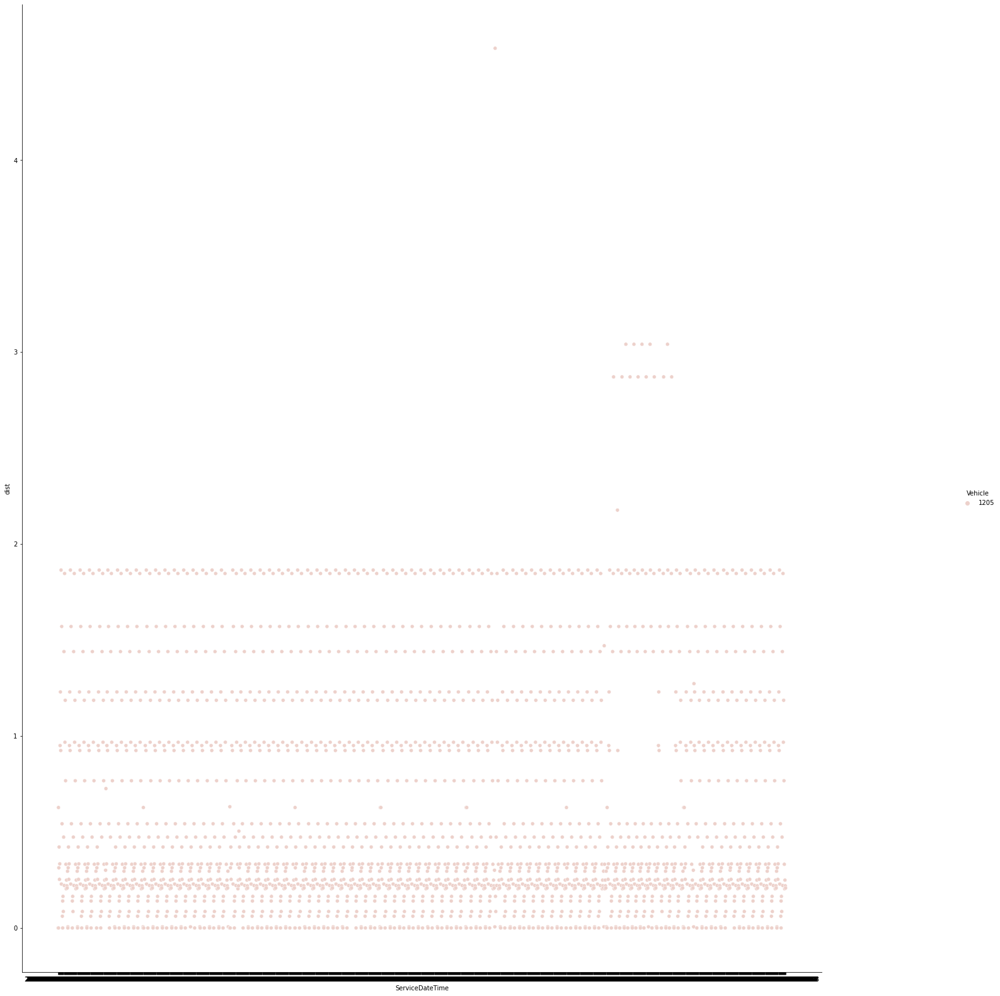

In [86]:
egs = [1205]
ax=sns.relplot(x='ServiceDateTime', y='dist',
            hue='Vehicle',
            data=df.loc[df.Vehicle.isin(egs)],
            kind='scatter', ci=None
           )
ax.fig.set_size_inches(25,25)

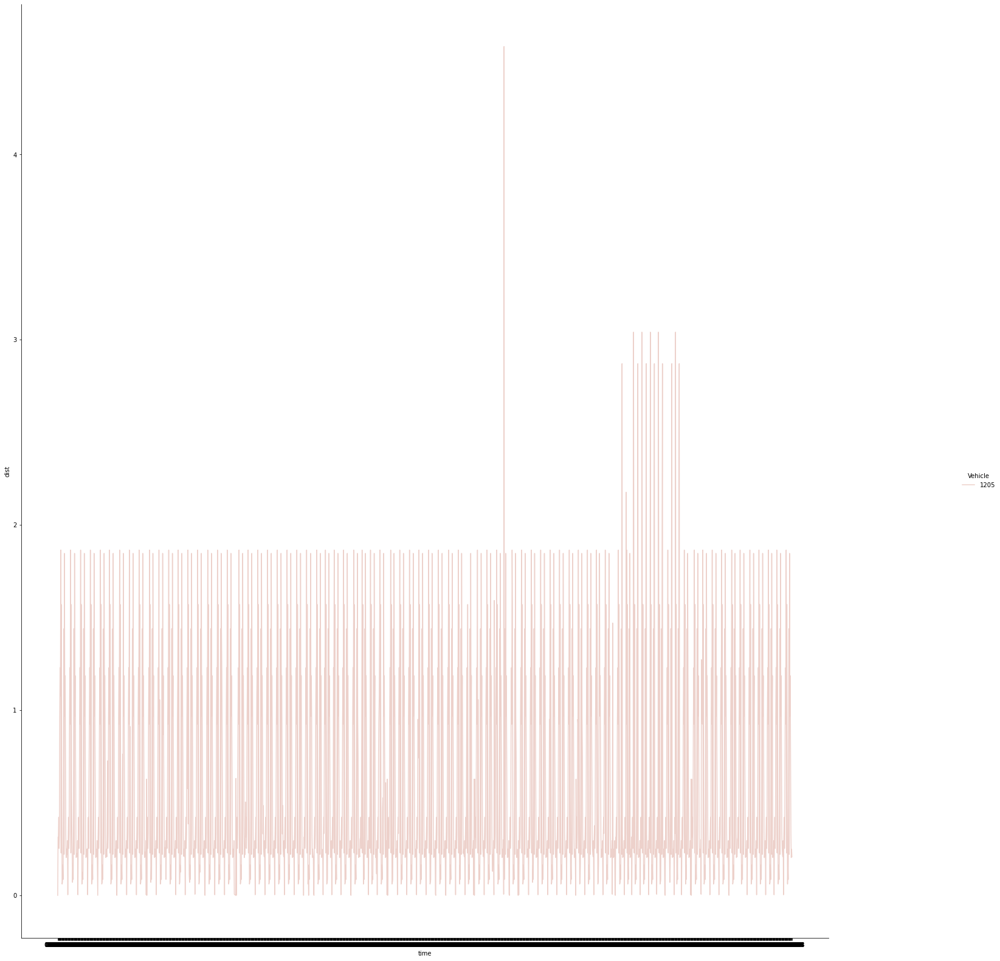

In [87]:
egs = [1205]
ax=sns.relplot(x='time', y='dist',
            hue='Vehicle',
            data=df.loc[df.Vehicle.isin(egs)],
            kind='line', ci=None
           )
ax.fig.set_size_inches(25,25)

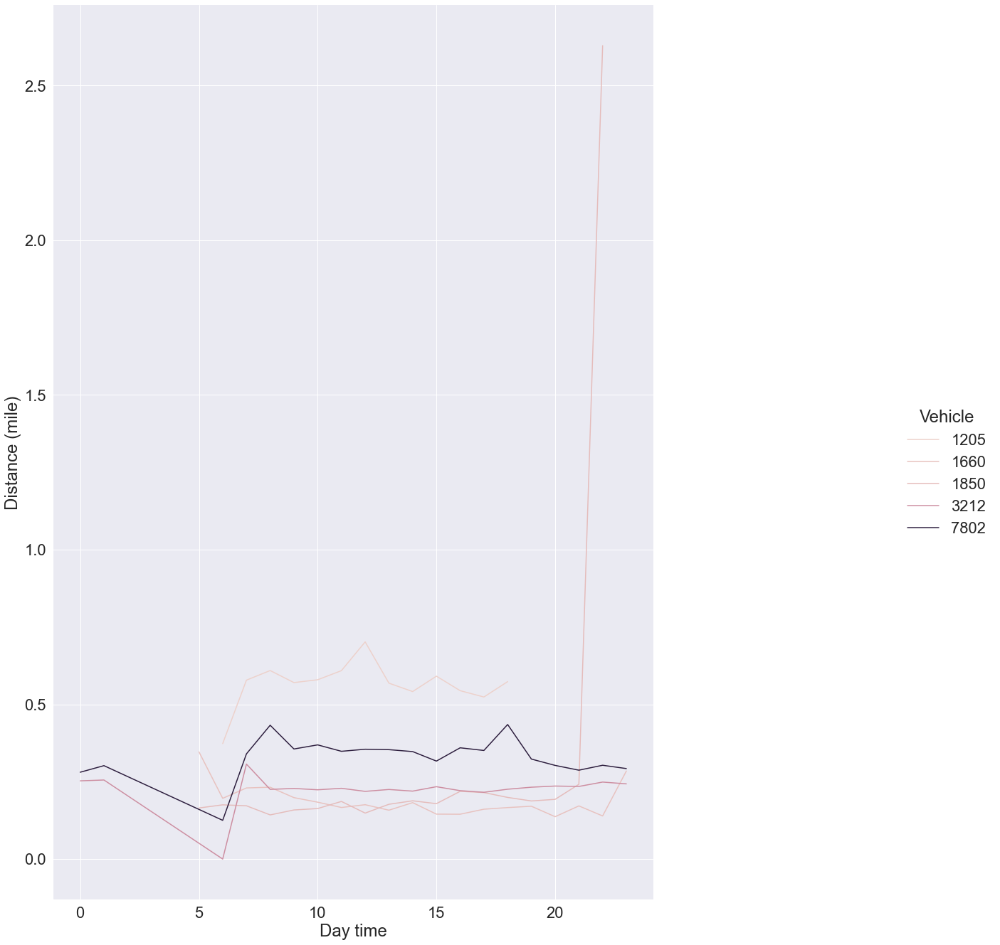

In [88]:
sns.set(font_scale=2)
egs = [1205, 1660, 1850, 3212, 7802]
ax=sns.relplot(x='Hour', y='dist',
            hue='Vehicle',
            data=df.loc[df.Vehicle.isin(egs)],
            kind='line', ci=None
           )
ax.fig.set_size_inches(25,25)
ax.set(ylabel='Distance (mile)', xlabel='Day time')
plt.show()

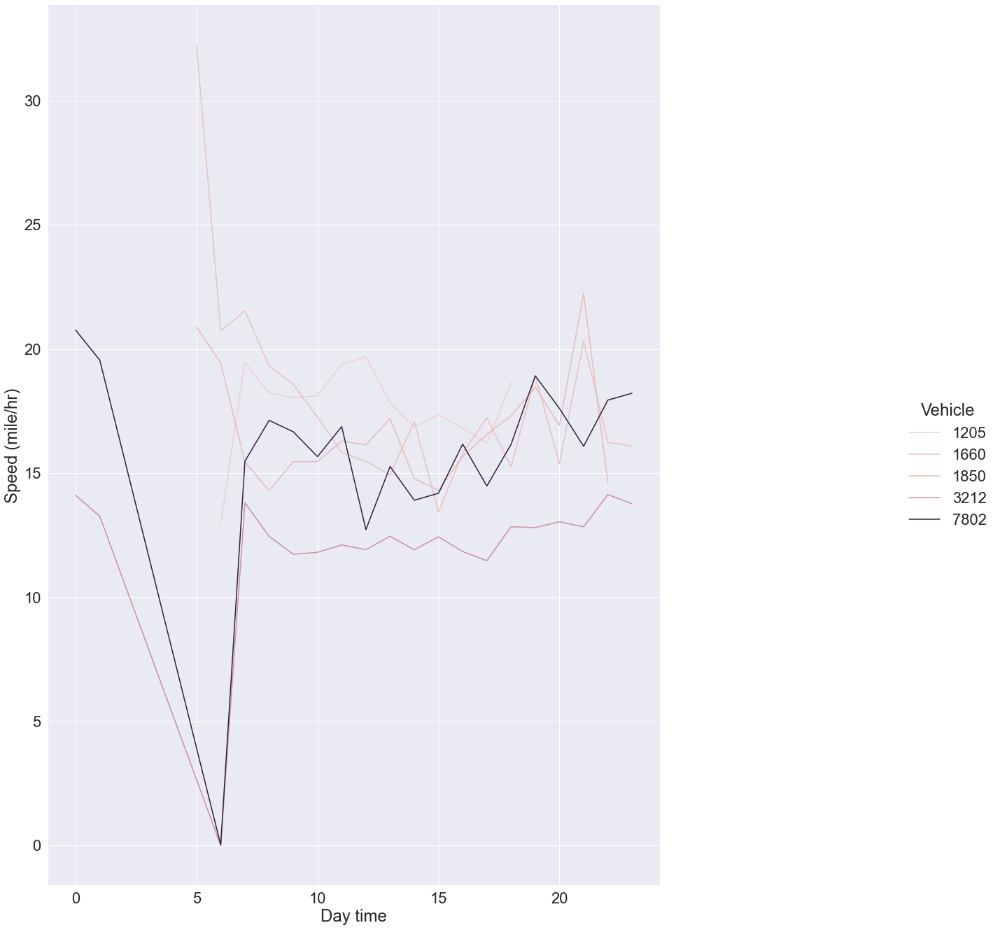

In [89]:
sns.set(font_scale=2)
egs = [1205, 1660, 1850, 3212, 7802]
ax=sns.relplot(x='Hour', y='speed',
            hue='Vehicle',
            data=df.loc[df.Vehicle.isin(egs)],
            kind='line', ci=None
           )
ax.fig.set_size_inches(25,25)
ax.set(ylabel='Speed (mile/hr)', xlabel='Day time')
plt.show()

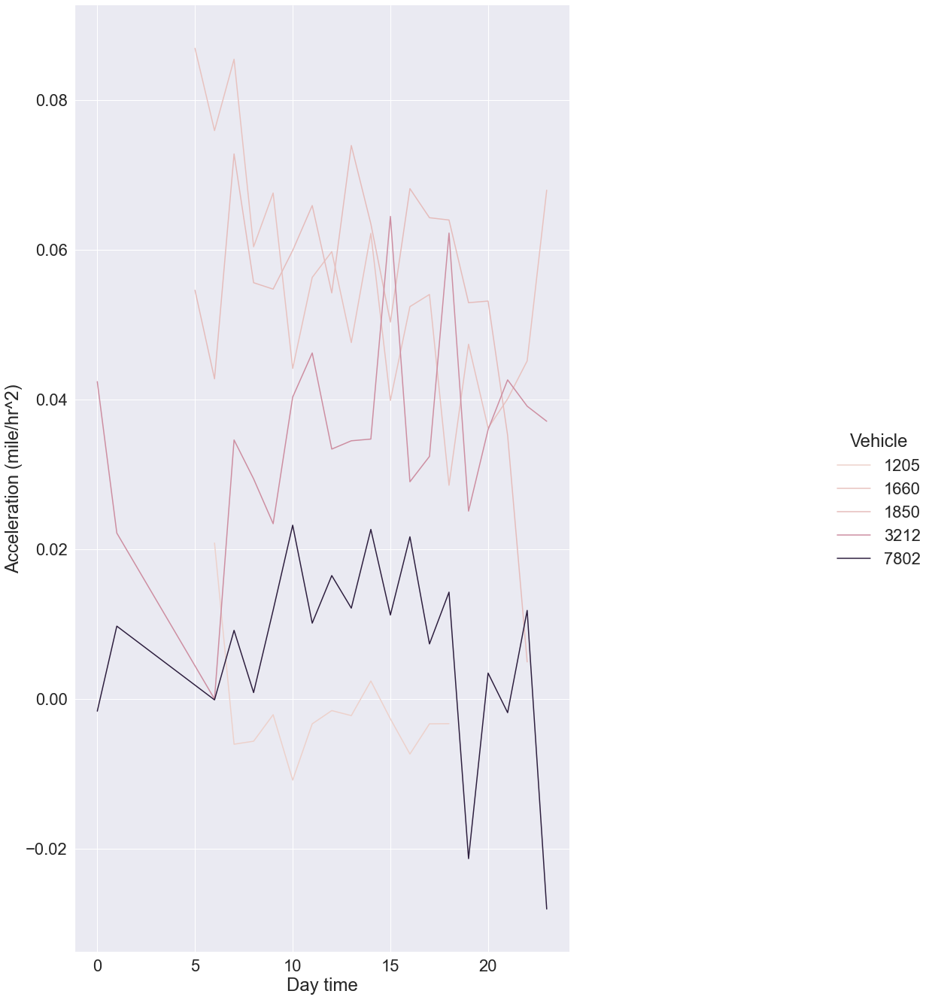

In [90]:
sns.set(font_scale=2)
egs = [1205, 1660, 1850, 3212, 7802]
ax=sns.relplot(x='Hour', y='acc',
            hue='Vehicle',
            data=df.loc[df.Vehicle.isin(egs)],
            kind='line', ci=None
           )
ax.fig.set_size_inches(25,25)
ax.set(ylabel='Acceleration (mile/hr^2)', xlabel='Day time')
plt.show()

In [91]:
#egs = [1205, 1660]
#sns.relplot(x='ServiceDateTime', y='speed',
#            hue='Vehicle',
#            data=df.loc[df.Vehicle.isin(egs)],
#            kind='line', ci=None
#           )

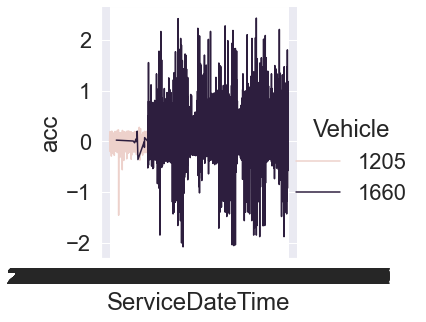

In [92]:
egs = [1205, 1660]
sns.relplot(x='ServiceDateTime', y='acc',
            hue='Vehicle',
            data=df.loc[df.Vehicle.isin(egs)],
            kind='line', ci=None
           )

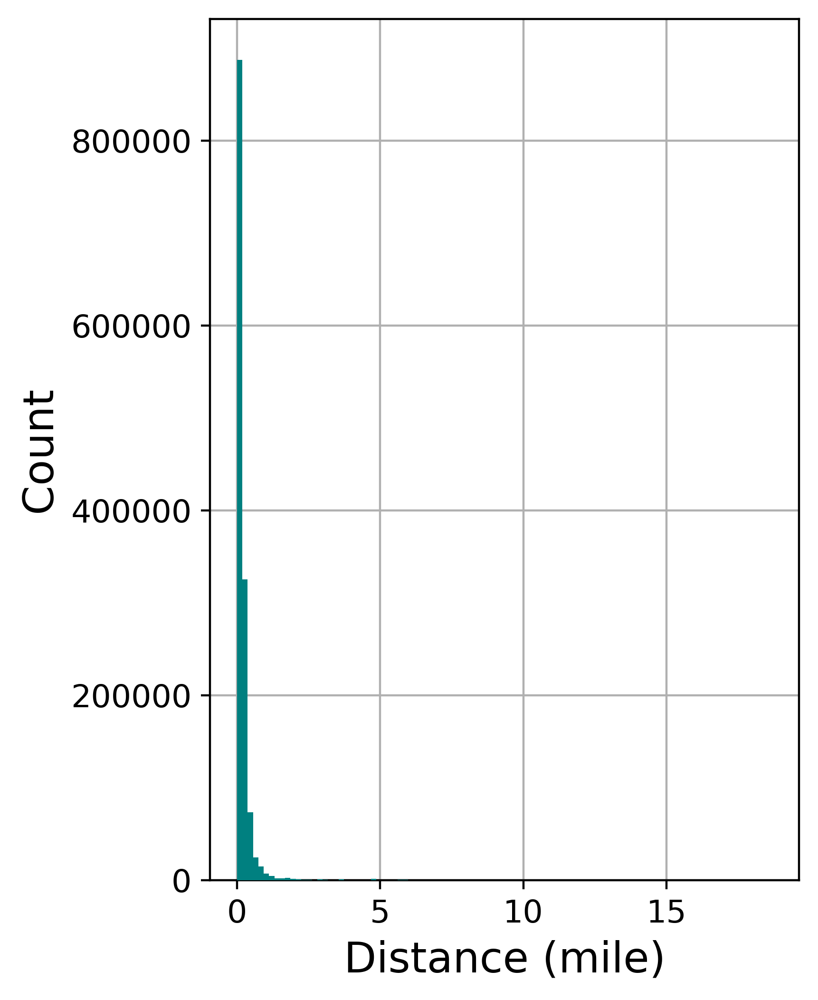

In [17]:
figure(figsize=(4 , 6), dpi=400)
ax=df['dist'].hist(bins=100, zorder=3)
ax.set_xlabel('Distance (mile)', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig(r'../../figures/hist-trajectories-distance.png', dpi=400, bbox_inches='tight')

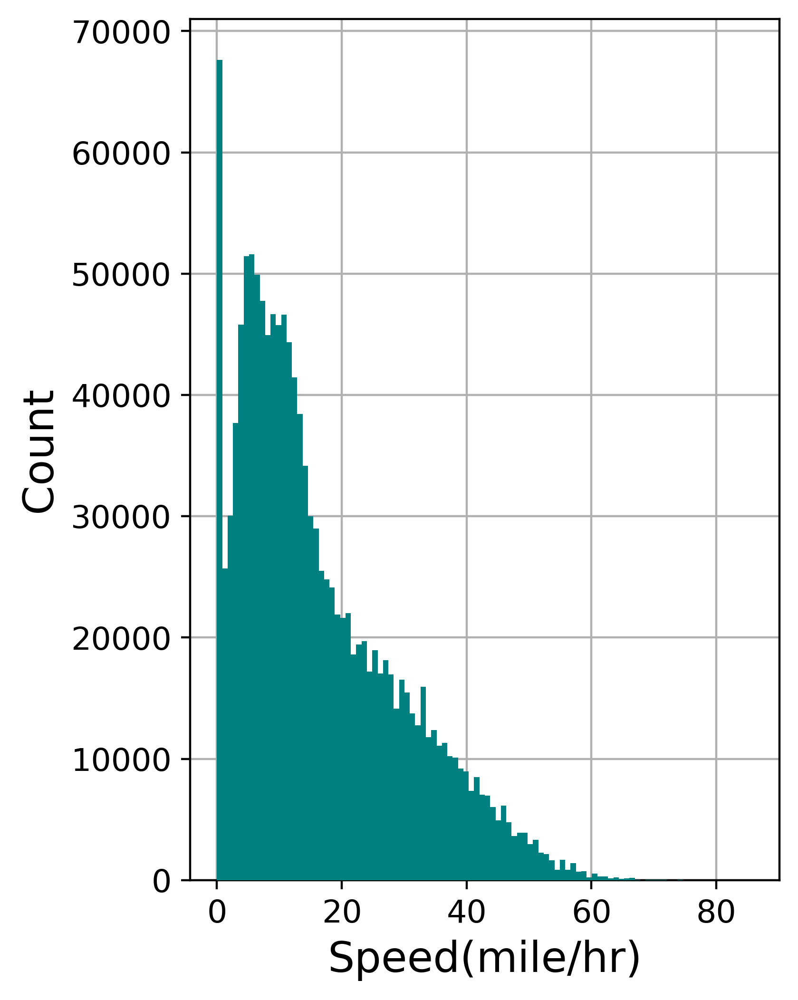

In [18]:
figure(figsize=(4 , 6), dpi=400)
ax=df['speed'].hist(bins=100, color='teal', zorder=3)
ax.set_xlabel('Speed(mile/hr)', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig(r'../../figures/hist-trajectories-speed.png', dpi=400, bbox_inches='tight')

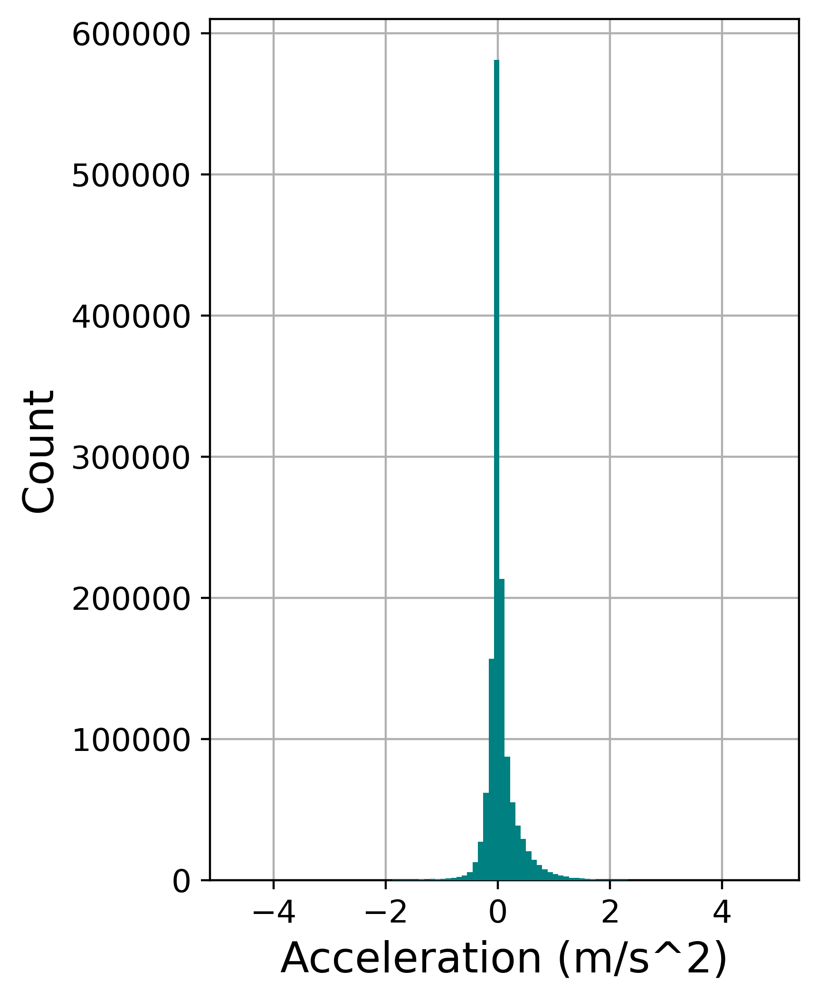

In [19]:
figure(figsize=(4, 6), dpi=400)
ax=df['acc'].hist(bins=100, color='teal', zorder=3)
ax.set_xlabel('Acceleration (m/s^2)', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig(r'../../figures/hist-trajectories-acceleration.png', dpi=400, bbox_inches='tight')

In [135]:
#df.set_index(['time', 'Vehicle'])['dist'].unstack()

In [136]:
#fig, ax = plt.subplots(figsize=(25,25))

#for key, grp in df.groupby(['Vehicle']):
#    ax = grp.plot(ax=ax, kind='scatter', x='ServiceDateTime', y='dist', label=key)

#plt.legend(loc='best')
#plt.show()

In [137]:
#df_new=df.set_index('Date')
#df_new.groupby([''])['Date'].plot(legend=True)

In [138]:
#vehicles=df['Vehicles'].unique

In [139]:
#len(vehicles)

In [140]:
#fig, ax = plt.subplots(figsize=(25,25))

#for key, grp in df.groupby(['Vehicle']):
#    ax = grp.plot(ax=ax, kind='scatter', x='ServiceDateTime', y='dist', label=key)

#plt.legend(loc='best')
#plt.show()

In [86]:
#df=df.set_index('ServiceDateTime')

In [95]:
#df=df.reset_index()

In [191]:
#df.pivot(index='ServiceDateTime', columns='Vehicle', values='dist').plot()

In [199]:
df.columns

Index(['ServiceDateTime', 'Unnamed: 0', 'DateKey', 'CalendarDate', 'Year',
       'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2', 'Route', 'RouteName',
       'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName', 'Lat', 'Lon',
       'Vehicle', 'VehicleType', 'SeatedCap', 'TotalCap', 'Boards', 'Alights',
       'Onboard', 'Bike', 'Wheelchair', 'Weekday', 'Hour', 'Minute', 'Second',
       'Date', 'Daytype', 'time', 'time_delta', 'time_delta_in_seconds',
       'dist', 'speed', 'acc'],
      dtype='object')

In [214]:
len(df['Route'].unique())

49

In [215]:
len(df['Operator'].unique())

3

In [216]:
df['Route'].unique()

array(['R44', '(X) 39E', 'B43', '9999', '(X) P11', 'X92', '(X) 821',
       '(X) 804', '(X) 892', '(X) 823', '(X) 801', '(X) 820', 'G5',
       '(X) 802', 'X90', 'B4', 'R14', 'R10', 'G1', 'R29', 'B17', 'G3',
       '(X) 805', '(X) 824', '921', '(X) 803', 'G73', 'P20', 'P21', 'B6',
       'B7', 'G2', 'B12', '(X) 806', '(X) B9', 'B23', 'R24', '31', '30',
       '(X) 38', '33', '46', '45', '35', '(X) 34', 'R41', 'R42', 'B48',
       '(X) 943'], dtype=object)

In [3]:
trajectories = pd.read_csv(r'../../results/computed-trajectories.csv', delimiter=',', skiprows=0, low_memory=False)

In [4]:
trajectories.columns

Index(['Unnamed: 0.1', 'ServiceDateTime', 'Unnamed: 0', 'DateKey',
       'CalendarDate', 'Year', 'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2',
       'Route', 'RouteName', 'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName',
       'Lat', 'Lon', 'Vehicle', 'VehicleType', 'SeatedCap', 'TotalCap',
       'Boards', 'Alights', 'Onboard', 'Bike', 'Wheelchair', 'Weekday', 'Hour',
       'Minute', 'Second', 'Date', 'Daytype', 'time', 'time_delta',
       'time_delta_in_seconds', 'dist', 'speed', 'acc'],
      dtype='object')

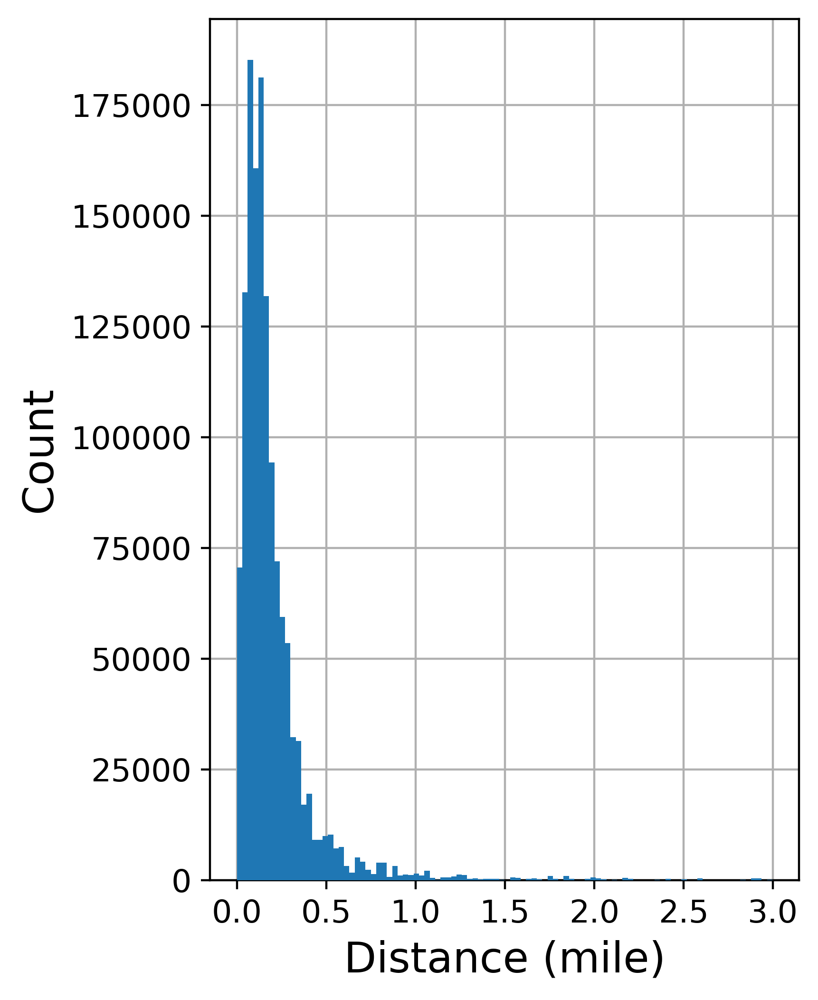

In [13]:
figure(figsize=(4 , 6), dpi=400)
filtered_distances=trajectories[trajectories['dist']<3]
ax=filtered_distances['dist'].hist(bins=100, zorder=3)
ax.set_xlabel('Distance (mile)', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig(r'../../figures/hist-trajectories-distance.png', dpi=400, bbox_inches='tight')

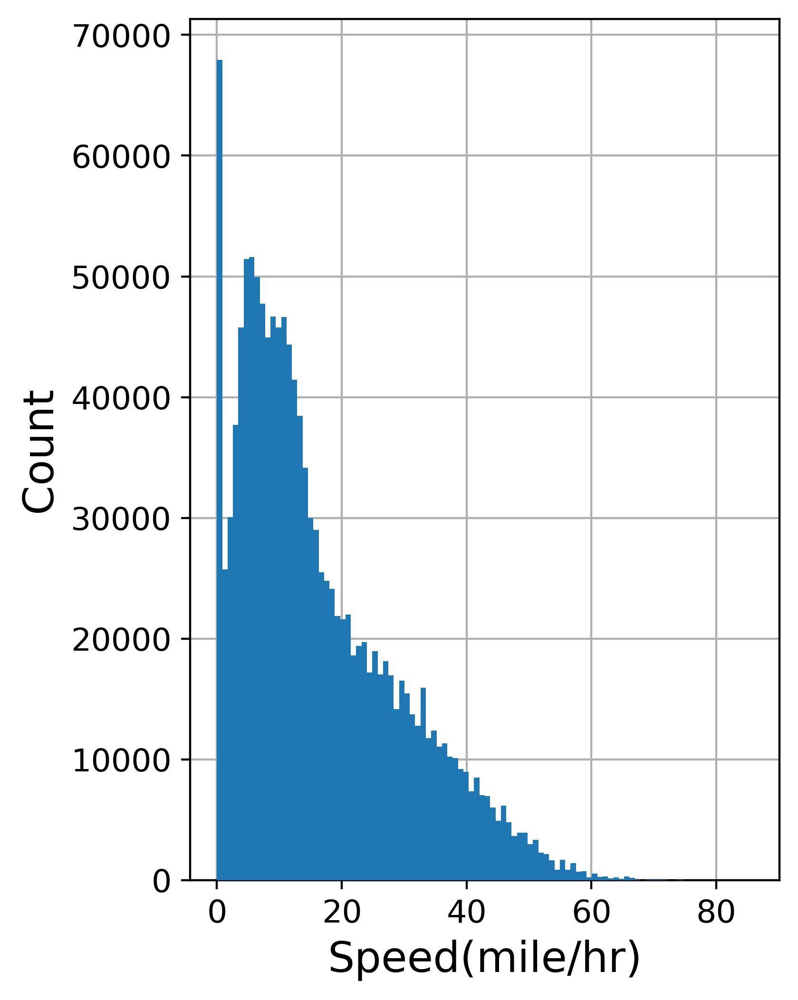

In [9]:
figure(figsize=(4 , 6), dpi=400)
ax=trajectories['speed'].hist(bins=100, zorder=3)
ax.set_xlabel('Speed(mile/hr)', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig(r'../../figures/hist-trajectories-speed.png', dpi=400, bbox_inches='tight')

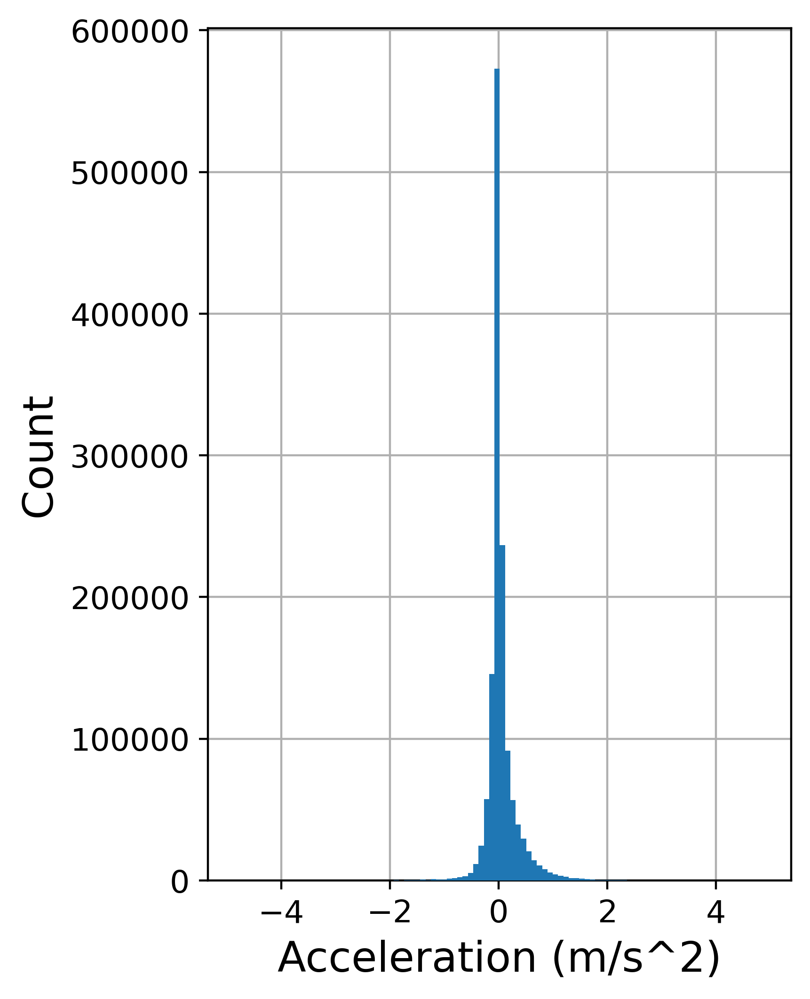

In [10]:
figure(figsize=(4, 6), dpi=400)
ax=trajectories['acc'].hist(bins=100, zorder=3)
ax.set_xlabel('Acceleration (m/s^2)', fontsize=16)
ax.set_ylabel('Count', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig(r'../../figures/hist-trajectories-acceleration.png', dpi=400, bbox_inches='tight')

In [14]:
len(trajectories['Vehicle'].unique())

178

In [15]:
type(trajectories.loc[100].at["ServiceDateTime"])

str

In [16]:
trajectories.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1361549 entries, 0 to 1361548
Data columns (total 41 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0.1           1361549 non-null  int64  
 1   ServiceDateTime        1361549 non-null  object 
 2   Unnamed: 0             1361549 non-null  int64  
 3   DateKey                1361549 non-null  int64  
 4   CalendarDate           1361549 non-null  object 
 5   Year                   1361549 non-null  int64  
 6   Month                  1361549 non-null  int64  
 7   OpKey                  1361549 non-null  int64  
 8   Operator               1361549 non-null  object 
 9   RtKey                  1361549 non-null  int64  
 10  RtKey2                 1361549 non-null  int64  
 11  Route                  1361549 non-null  object 
 12  RouteName              1352172 non-null  object 
 13  TripKey                1361549 non-null  int64  
 14  Trip              

In [17]:
trajectories['ServiceDateTime']= pd.to_datetime(trajectories['ServiceDateTime'])

In [18]:
trajectories.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1361549 entries, 0 to 1361548
Data columns (total 41 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   Unnamed: 0.1           1361549 non-null  int64         
 1   ServiceDateTime        1361549 non-null  datetime64[ns]
 2   Unnamed: 0             1361549 non-null  int64         
 3   DateKey                1361549 non-null  int64         
 4   CalendarDate           1361549 non-null  object        
 5   Year                   1361549 non-null  int64         
 6   Month                  1361549 non-null  int64         
 7   OpKey                  1361549 non-null  int64         
 8   Operator               1361549 non-null  object        
 9   RtKey                  1361549 non-null  int64         
 10  RtKey2                 1361549 non-null  int64         
 11  Route                  1361549 non-null  object        
 12  RouteName              13521

In [19]:
trajectories = trajectories.set_index("ServiceDateTime")
trajectories

,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
ServiceDateTime,,,,,,,,,,,,,,,,,,,,,
2022-04-04 06:43:24,0,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,43,24,2022-04-04,Weekday,06:43:24,NaN,NaN,0.000000,0.000000,0.000000
2022-04-04 06:51:27,1,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,51,27,2022-04-04,Weekday,06:51:27,2022-07-28 00:08:03,483.0,0.627342,0.000000,0.000000
2022-04-04 06:51:27,2,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,51,27,2022-04-04,Weekday,06:51:27,2022-07-28 00:00:00,0.0,0.000000,0.000000,0.000000
2022-04-04 06:52:52,3,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,52,52,2022-04-04,Weekday,06:52:52,2022-07-28 00:01:25,85.0,0.313431,13.274729,0.069816
2022-04-04 06:54:33,4,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,54,33,2022-04-04,Weekday,06:54:33,2022-07-28 00:01:41,101.0,0.421734,15.032101,0.007778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-30 23:54:20,1361544,1325566,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,54,20,2022-04-30,Weekend,23:54:20,2022-07-28 00:02:20,140.0,0.254140,6.535024,0.003673
2022-04-30 23:55:24,1361545,1325567,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,55,24,2022-04-30,Weekend,23:55:24,2022-07-28 00:01:04,64.0,0.156799,8.819951,0.015960
2022-04-30 23:56:47,1361546,1325568,8789,2022-04-30 00:00:00.000,2022,4,1,VATCo,3515,1001,...,56,47,2022-04-30,Weekend,23:56:47,2022-07-28 00:01:23,83.0,0.144950,6.286980,-0.013643


In [20]:
trajectories["Date"]

ServiceDateTime
2022-04-04 06:43:24    2022-04-04
2022-04-04 06:51:27    2022-04-04
2022-04-04 06:51:27    2022-04-04
2022-04-04 06:52:52    2022-04-04
2022-04-04 06:54:33    2022-04-04
                          ...    
2022-04-30 23:54:20    2022-04-30
2022-04-30 23:55:24    2022-04-30
2022-04-30 23:56:47    2022-04-30
2022-04-30 23:57:32    2022-04-30
2022-04-30 23:59:29    2022-04-30
Name: Date, Length: 1361549, dtype: object

In [21]:
selected_date=['2022-04-04']
plot_data=trajectories.loc[trajectories.Date.isin(selected_date)]

In [22]:
plot_data

,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
ServiceDateTime,,,,,,,,,,,,,,,,,,,,,
2022-04-04 06:43:24,0,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,43,24,2022-04-04,Weekday,06:43:24,NaN,NaN,0.000000,0.000000,0.000000
2022-04-04 06:51:27,1,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,51,27,2022-04-04,Weekday,06:51:27,2022-07-28 00:08:03,483.0,0.627342,0.000000,0.000000
2022-04-04 06:51:27,2,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,51,27,2022-04-04,Weekday,06:51:27,2022-07-28 00:00:00,0.0,0.000000,0.000000,0.000000
2022-04-04 06:52:52,3,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,52,52,2022-04-04,Weekday,06:52:52,2022-07-28 00:01:25,85.0,0.313431,13.274729,0.069816
2022-04-04 06:54:33,4,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,54,33,2022-04-04,Weekday,06:54:33,2022-07-28 00:01:41,101.0,0.421734,15.032101,0.007778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-04 19:00:30,1348358,111110,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3515,1001,...,0,30,2022-04-04,Weekday,19:00:30,2022-07-28 00:02:14,134.0,0.219698,5.902347,-0.010855
2022-04-04 19:01:28,1348359,111111,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3515,1001,...,1,28,2022-04-04,Weekday,19:01:28,2022-07-28 00:00:58,58.0,0.208149,12.919584,0.054086
2022-04-04 19:02:59,1348360,111112,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3515,1001,...,2,59,2022-04-04,Weekday,19:02:59,2022-07-28 00:01:31,91.0,0.295510,11.690508,-0.006038


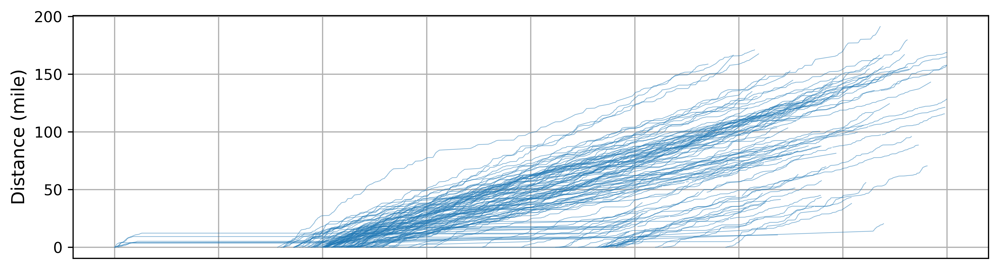

In [46]:
# set size

figure(figsize=(11, 3), dpi=600)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    plt.plot(plot_df["dist"].cumsum(), marker='', color='#1f77b4', linewidth=0.5, alpha=0.5)

# Remove x-ticks
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

# Labelling 

#plt.xlabel("time")
plt.ylabel("Distance (mile)", fontsize=12)
#plt.title("Pandas Time Series Plot")
plt.yticks(fontsize=10)
plt.grid()


# Saving
plt.savefig(r'../../figures/trajectories-distance.png', dpi=600, bbox_inches='tight')


# Display

plt.show()

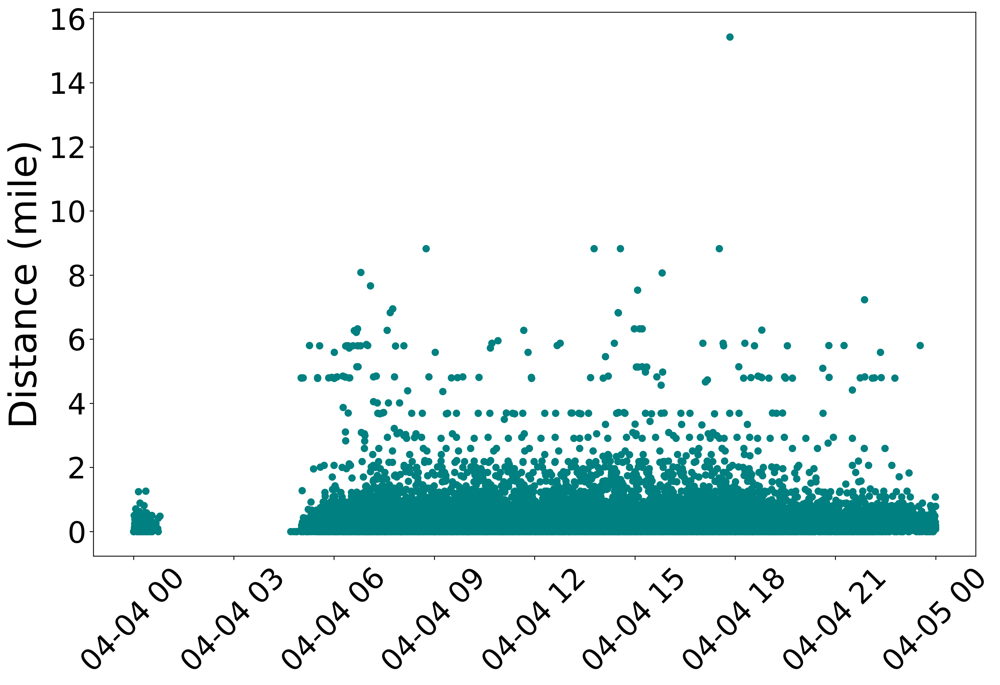

In [255]:
figure(figsize=(15, 9.5), dpi=300)
plt.plot_date(x=plot_data.index , y=plot_data["dist"], fmt='o', tz=None, xdate=True, ydate=False, color='teal')
plt.ylabel("Distance (mile)", fontsize=36)
plt.xticks(fontsize=28, rotation = 45)
plt.yticks(fontsize=28)
# plt.savefig(r'../../figures/trajectories-distance.png', dpi=400, bbox_inches='tight')
plt.show()

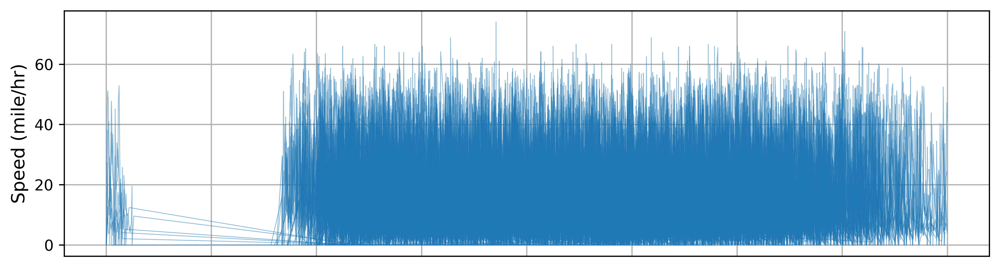

In [47]:
# set size

figure(figsize=(11, 3), dpi=600)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    plt.plot(plot_df["speed"], marker='',color='#1f77b4', linewidth=0.5, alpha=0.5)



# Remove x-ticks
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

# Labelling 

#plt.xlabel("time")
plt.ylabel("Speed (mile/hr)", fontsize=12)
plt.yticks(fontsize=10)
#plt.title("Pandas Time Series Plot")
plt.grid()

# Saving
plt.savefig(r'../../figures/trajectories-speed.png', dpi=600, bbox_inches='tight')

# Display

plt.show()

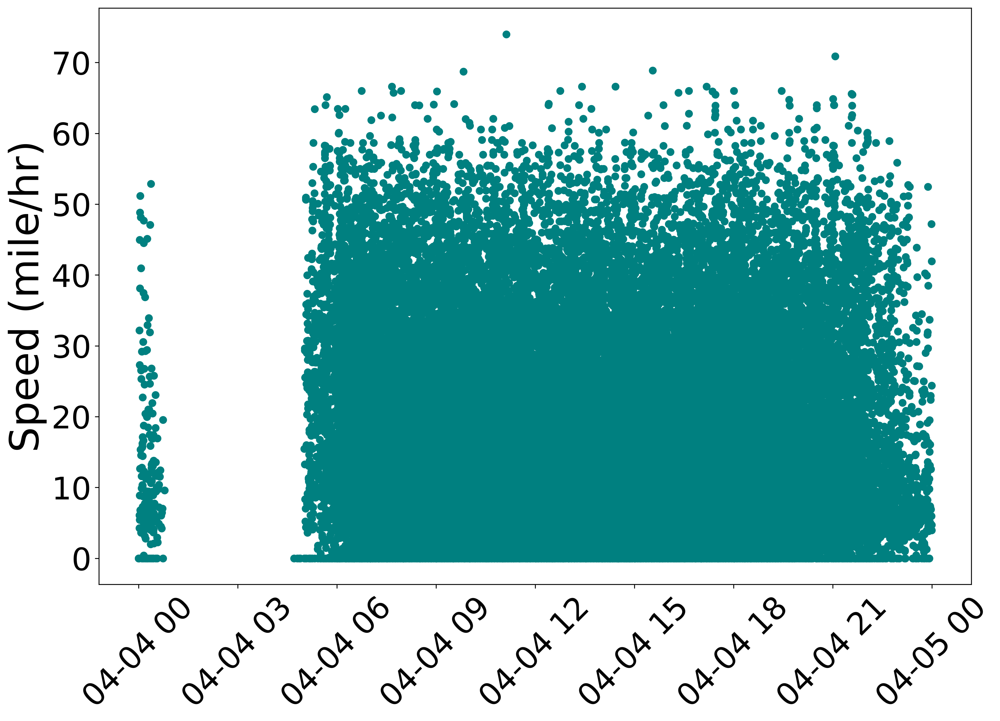

In [231]:
figure(figsize=(14, 9.5), dpi=300)
plt.plot_date(x=plot_data.index , y=plot_data["speed"], fmt='o', tz=None, xdate=True, ydate=False, color='teal')
plt.ylabel("Speed (mile/hr)", fontsize=36)
plt.xticks(fontsize=28, rotation = 45)
plt.yticks(fontsize=28)
# plt.savefig(r'../../figures/trajectories-speed.png', dpi=400, bbox_inches='tight')
plt.show()

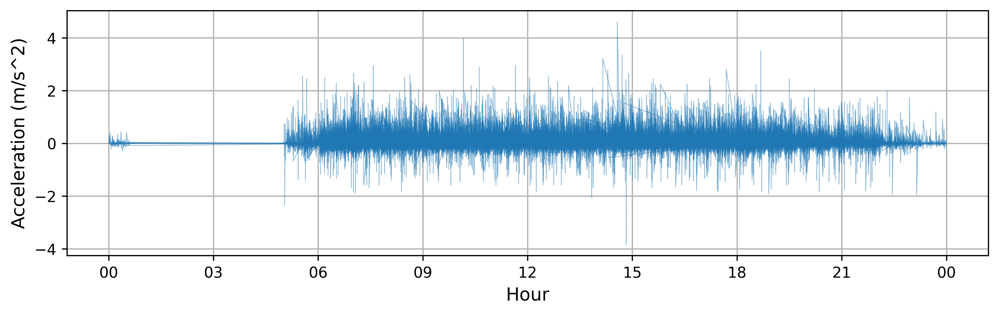

In [48]:
# set size
fig, ax = plt.subplots(figsize=(11, 3), dpi=600)
#figure(figsize=(11, 4), dpi=400)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    plt.plot(plot_df["acc"], marker='', color='#1f77b4', linewidth=0.5, alpha=0.5)


# Labelling 

#plt.xlabel("time")
plt.ylabel("Acceleration (m/s^2)", fontsize=12)
plt.xlabel("Hour", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
#plt.title("Pandas Time Series Plot")
plt.grid()

date_form = DateFormatter("%H")
ax.xaxis.set_major_formatter(date_form)

# Saving
plt.savefig(r'../../figures/trajectories-acceleration.png', dpi=600, bbox_inches='tight')

# Display

plt.show()

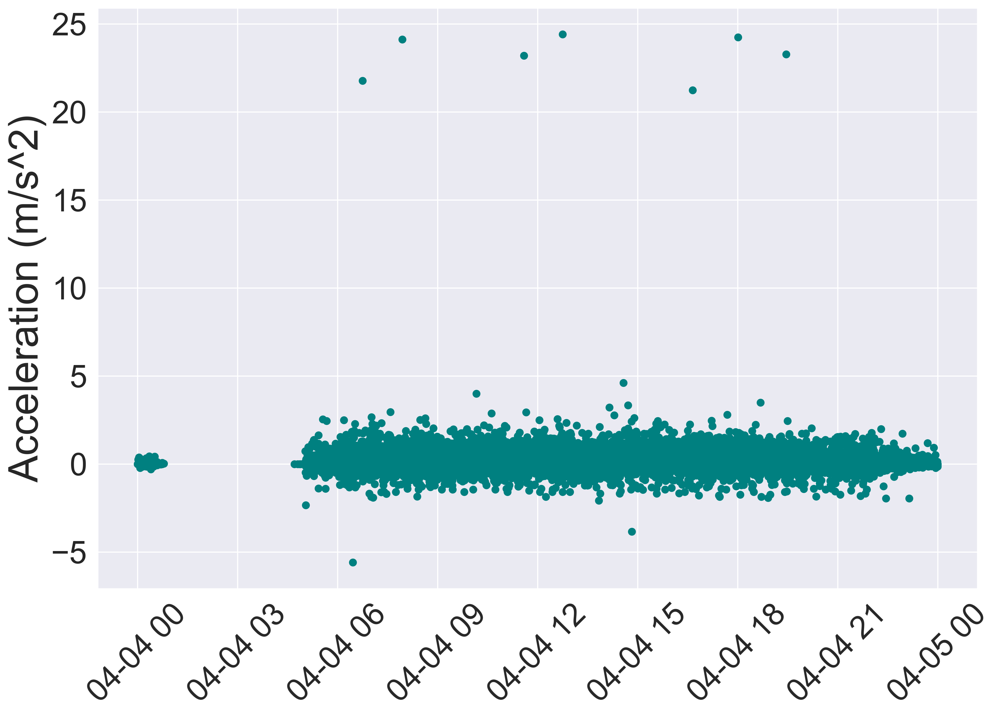

In [204]:
figure(figsize=(14, 9.5), dpi=300)
plt.plot_date(x=plot_data.index , y=plot_data["acc"], fmt='o', tz=None, xdate=True, ydate=False, color='teal')
plt.ylabel("Acceleration (m/s^2)", fontsize=36)
plt.xticks(fontsize=28, rotation = 45)
plt.yticks(fontsize=28)
# plt.savefig(r'../../figures/trajectories-acceleration.png', dpi=400, bbox_inches='tight')
plt.show()

In [23]:
trajectories=trajectories.reset_index()
trajectories.head()

,ServiceDateTime,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,...,Weekday,Hour,Minute,Second,Date,Daytype,time,dist,speed,acc
0,2022-04-04 06:43:24,0,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,...,2,6,43,24,2022-04-04,Weekday,06:43:24,0.000000,0.000000,0.000000
1,2022-04-04 06:51:27,1,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,...,2,6,51,27,2022-04-04,Weekday,06:51:27,0.627342,0.000000,0.000000
2,2022-04-04 06:51:27,2,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,...,2,6,51,27,2022-04-04,Weekday,06:51:27,0.000000,0.000000,0.000000
3,2022-04-04 06:52:52,3,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,...,2,6,52,52,2022-04-04,Weekday,06:52:52,0.313431,13.274729,0.069816
4,2022-04-04 06:54:33,4,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,...,2,6,54,33,2022-04-04,Weekday,06:54:33,0.421734,15.032101,0.007778


In [24]:
trajectories.sort_values(by=['ServiceDateTime','Vehicle'], ascending=True, inplace=True)

In [25]:
trajectories['Vehicle']

1062086    3303
1346943    7901
1174966    3317
1213526    3322
1213527    3322
           ... 
1245865    3325
1057256    3301
1361548    7902
1031475    3222
1245866    3325
Name: Vehicle, Length: 1361549, dtype: int64

In [26]:
#trajectories['time_delta'] = trajectories.groupby(['Vehicle', 'Date'])['ServiceDateTime'].diff()

In [27]:
trajectories['time_delta'].max()

Timedelta('0 days 20:26:36')

In [28]:
trajectories['time_delta'].median()

Timedelta('0 days 00:00:41')

In [29]:
trajectories['time_delta'].min()

Timedelta('0 days 00:00:00')

In [30]:
trajectories['time_delta'].unique()

array([         'NaT',              0,    17000000000, ...,
       12664000000000,  3338000000000, 56031000000000],
      dtype='timedelta64[ns]')

In [31]:
#trajectories.time_delta=trajectories.time_delta.astype(str).str.replace('0 days ', '')

In [32]:
#trajectories['time_delta']= pd.to_datetime(trajectories['time_delta'])

In [34]:
#trajectories['time_delta_in_seconds'] = trajectories['time_delta'].dt.hour * 3600 + trajectories['time_delta'].dt.minute * 60 + trajectories['time_delta'].dt.second

In [35]:
trajectories['time_delta_in_seconds'].unique()

array([       nan, 0.0000e+00, 1.7000e+01, ..., 1.2664e+04, 3.3380e+03,
       5.6031e+04])

In [311]:
trajectories.head()

,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
ServiceDateTime,,,,,,,,,,,,,,,,,,,,,
2022-04-04 06:43:24,0,112564,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,43,24,2022-04-04,Weekday,06:43:24,NaN,NaN,0.000000,0.000000,0.000000
2022-04-04 06:51:27,1,109326,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,51,27,2022-04-04,Weekday,06:51:27,2022-07-21 00:08:03,483.0,0.627342,0.000000,0.000000
2022-04-04 06:51:27,2,112565,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3519,1006,...,51,27,2022-04-04,Weekday,06:51:27,2022-07-21 00:00:00,0.0,0.000000,0.000000,0.000000
2022-04-04 06:52:52,3,109327,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,52,52,2022-04-04,Weekday,06:52:52,2022-07-21 00:01:25,85.0,0.313431,13.274729,0.069816
2022-04-04 06:54:33,4,109328,8763,2022-04-04 00:00:00.000,2022,4,1,VATCo,3513,3380,...,54,33,2022-04-04,Weekday,06:54:33,2022-07-21 00:01:41,101.0,0.421734,15.032101,0.007778


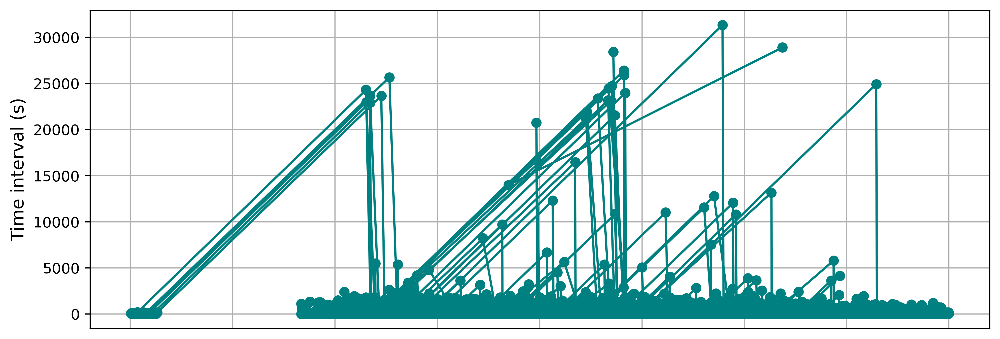

In [312]:
# set size

figure(figsize=(11, 4), dpi=400)

# Plot
vehicle=plot_data['Vehicle'].unique()
for v in vehicle:
    plot_df=plot_data[plot_data['Vehicle']==v]
    plt.plot(plot_df["time_delta_in_seconds"], marker='o', color='teal')



# Remove x-ticks
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off

# Labelling 

#plt.xlabel("time")
plt.ylabel("Time interval (s)", fontsize=12)
plt.yticks(fontsize=10)
#plt.title("Pandas Time Series Plot")
plt.grid()

# Saving
plt.savefig(r'../../figures/time-intervals.png', dpi=400, bbox_inches='tight')

# Display

plt.show()

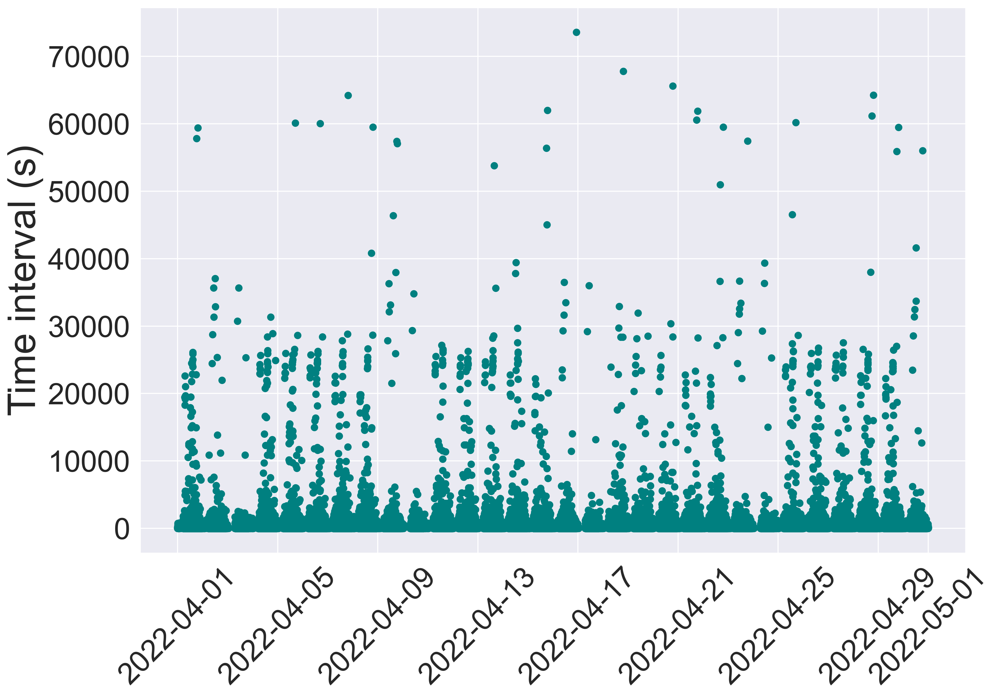

In [258]:
figure(figsize=(14, 9.5), dpi=300)
plt.plot_date(x=trajectories['ServiceDateTime']  , y=trajectories["time_delta_in_seconds"], fmt='o', tz=None, xdate=True, ydate=False, color='teal')
plt.ylabel("Time interval (s)", fontsize=36)
plt.xticks(fontsize=28, rotation = 45)
plt.yticks(fontsize=28)
#plt.savefig(r'../../figures/time-intervals.png', dpi=400, bbox_inches='tight')
plt.show()

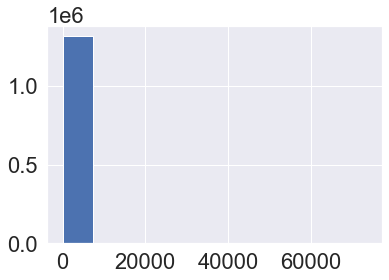

In [259]:
df_time_intervals = trajectories[trajectories['time_delta_in_seconds'] > 0]
plt.hist(df_time_intervals['time_delta_in_seconds'])
#plt.savefig(r'../../figures/hist-time-intervals.png', dpi=400, bbox_inches='tight')
plt.show()

In [264]:
len(df['Route'].unique())

49

In [275]:
trajectories.to_csv(r'../../results/computed-trajectories-v02.csv')

In [290]:
df_acc = trajectories.sort_values('acc', ascending=False)
df_acc['acc']

388111     366.432779
640285     290.453593
749058     115.547654
395478      60.633283
395361      60.573972
              ...    
1057244           NaN
1256736           NaN
1256737           NaN
1057245           NaN
1256738           NaN
Name: acc, Length: 1361549, dtype: float64

In [281]:
df_dist = trajectories.sort_values('dist', ascending=False)
df_dist['dist']

58281      18.700636
108414     15.433128
34204      15.433128
83989      15.433128
84389      15.433128
             ...    
1245847          NaN
1057244          NaN
1256736          NaN
1256737          NaN
1057245          NaN
Name: dist, Length: 1361549, dtype: float64

In [289]:
df_speed = trajectories.sort_values('speed', ascending=False)
df_speed['speed'].head(50000)

640285     1302.567192
388111      831.948441
395361      413.425971
395478      413.425971
749058      271.761947
              ...     
1179787      44.405755
1215421      44.405755
1176321      44.405755
1239187      44.405755
1070230      44.405755
Name: speed, Length: 50000, dtype: float64

In [293]:
trajectories['dist'].max()

18.700636389473715

In [310]:
trajectories['dist'].median()

0.13982343973076

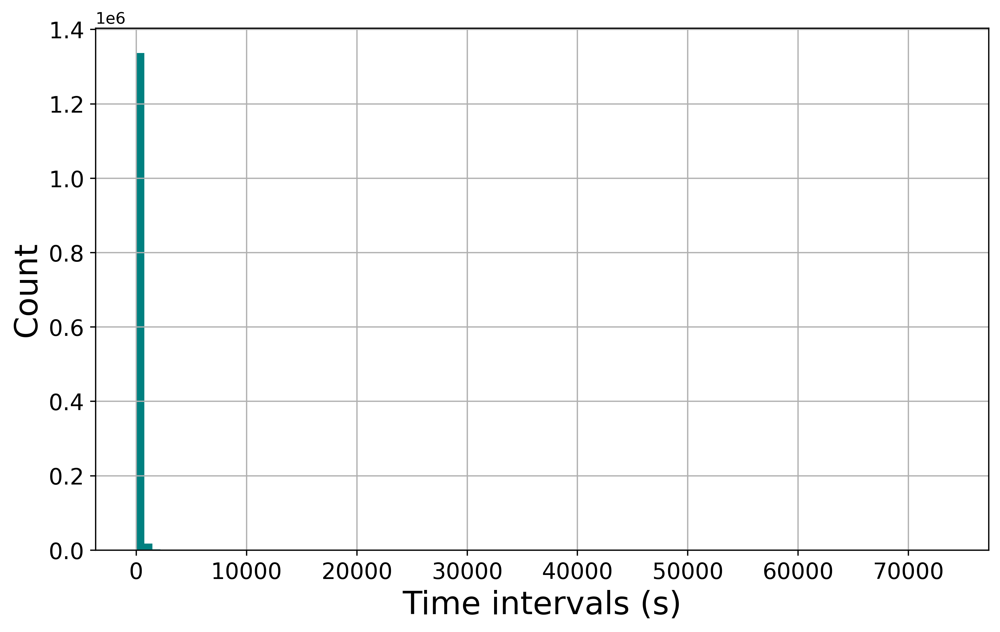

In [318]:
figure(figsize=(10, 6), dpi=400)
ax=trajectories['time_delta_in_seconds'].hist(bins=100, color='teal')
ax.set_xlabel('Time intervals (s)', fontsize=20)
ax.set_ylabel('Count', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.savefig(r'../../figures/hist-time-intervals.png', dpi=400, bbox_inches='tight')

In [315]:
trajectories['time_delta_in_seconds'].max()

73596.0

In [316]:
trajectories['time_delta_in_seconds'].median()

41.0

In [317]:
trajectories['time_delta_in_seconds'].mean()

93.28536946247958

In [323]:
df_dist_outliers=trajectories[trajectories['dist']>15]

In [324]:
df_dist_outliers

,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
ServiceDateTime,,,,,,,,,,,,,,,,,,,,,
2022-04-05 17:53:05,34204,206300,8764,2022-04-05 00:00:00.000,2022,4,2,SATCo,3630,1104,...,53,5,2022-04-05,Weekday,17:53:05,2022-07-21 00:29:39,1779.0,15.433128,31.230614,0.007848
2022-04-18 17:13:14,58281,757850,8777,2022-04-18 00:00:00.000,2022,4,2,SATCo,3631,1104,...,13,14,2022-04-18,Weekday,17:13:14,2022-07-21 00:35:16,2116.0,18.700636,31.815828,0.006722
2022-04-25 17:50:45,70610,1060393,8784,2022-04-25 00:00:00.000,2022,4,2,SATCo,3631,1104,...,50,45,2022-04-25,Weekday,17:50:45,2022-07-21 00:27:42,1662.0,15.433123,33.429148,0.008992
2022-04-04 17:50:27,73742,152939,8763,2022-04-04 00:00:00.000,2022,4,2,SATCo,3630,1104,...,50,27,2022-04-04,Weekday,17:50:27,2022-07-21 00:27:32,1652.0,15.433128,33.631514,0.009101
2022-04-08 06:35:13,83989,366354,8767,2022-04-08 00:00:00.000,2022,4,2,SATCo,3620,3285,...,35,13,2022-04-08,Weekday,06:35:13,2022-07-21 00:52:32,3152.0,15.433128,17.626669,0.002500
2022-04-08 17:52:24,84389,366875,8767,2022-04-08 00:00:00.000,2022,4,2,SATCo,3630,1104,...,52,24,2022-04-08,Weekday,17:52:24,2022-07-21 00:28:08,1688.0,15.433128,32.914255,0.008717
2022-04-01 17:51:03,108414,43654,8760,2022-04-01 00:00:00.000,2022,4,2,SATCo,3630,1104,...,51,3,2022-04-01,Weekday,17:51:03,2022-07-21 00:27:41,1661.0,15.433128,33.449285,0.009003
2022-04-11 17:55:02,111686,437762,8770,2022-04-11 00:00:00.000,2022,4,2,SATCo,3631,1104,...,55,2,2022-04-11,Weekday,17:55:02,2022-07-21 00:30:25,1825.0,15.433123,30.443421,0.007457
2022-04-11 08:52:46,129899,469666,8770,2022-04-11 00:00:00.000,2022,4,2,SATCo,3655,1099,...,52,46,2022-04-11,Weekday,08:52:46,2022-07-21 00:39:09,2349.0,15.433123,23.652296,0.003014


In [327]:
df_time_intervals_outliers=trajectories[trajectories['time_delta_in_seconds']>50000]

In [328]:
df_time_intervals_outliers

,Unnamed: 0.1,Unnamed: 0,DateKey,CalendarDate,Year,Month,OpKey,Operator,RtKey,RtKey2,...,Minute,Second,Date,Daytype,time,time_delta,time_delta_in_seconds,dist,speed,acc
ServiceDateTime,,,,,,,,,,,,,,,,,,,,,
2022-04-21 18:53:04,1049579,948594,8780,2022-04-21 00:00:00.000,2022,4,3,UMASS,3626,1734,...,53,4,2022-04-21,Weekday,18:53:04,2022-07-21 17:11:40,61900.0,0.640671,0.037260,-3.718024e-05
2022-04-13 15:42:18,1125185,587700,8772,2022-04-13 00:00:00.000,2022,4,3,UMASS,3624,1737,...,42,18,2022-04-13,Weekday,15:42:18,2022-07-21 14:56:22,53782.0,NaN,NaN,0.000000e+00
2022-04-18 19:28:03,1148306,795469,8777,2022-04-18 00:00:00.000,2022,4,3,UMASS,3624,1737,...,28,3,2022-04-18,Weekday,19:28:03,2022-07-21 18:49:44,67784.0,0.217490,0.011551,-7.816170e-05
2022-04-20 18:51:56,1171769,898015,8779,2022-04-20 00:00:00.000,2022,4,3,UMASS,3626,1734,...,51,56,2022-04-20,Weekday,18:51:56,2022-07-21 18:13:30,65610.0,NaN,NaN,0.000000e+00
2022-04-15 18:41:54,1179445,694124,8774,2022-04-15 00:00:00.000,2022,4,3,UMASS,3625,1733,...,41,54,2022-04-15,Weekday,18:41:54,2022-07-21 17:13:23,62003.0,0.889334,0.051636,-3.071363e-05
2022-04-09 18:11:21,1186001,411711,8768,2022-04-09 00:00:00.000,2022,4,3,UMASS,3622,3308,...,11,21,2022-04-09,Weekend,18:11:21,2022-07-21 15:56:34,57394.0,0.599712,0.037617,2.929942e-07
2022-04-16 22:22:13,1239908,734460,8775,2022-04-16 00:00:00.000,2022,4,3,UMASS,3625,1733,...,22,13,2022-04-16,Weekend,22:22:13,2022-07-21 20:26:36,73596.0,0.964225,0.047166,-2.884899e-05
2022-04-05 16:49:19,1307711,163144,8764,2022-04-05 00:00:00.000,2022,4,1,VATCo,3410,1007,...,49,19,2022-04-05,Weekday,16:49:19,2022-07-21 16:41:46,60106.0,0.631544,0.037826,2.813304e-07
2022-04-06 16:50:01,1307952,216585,8765,2022-04-06 00:00:00.000,2022,4,1,VATCo,3410,1007,...,50,1,2022-04-06,Weekday,16:50:01,2022-07-21 16:40:56,60056.0,0.631544,0.037857,2.817990e-07
